<h1 align="center"> Image Captioning With Attention</h1>

In this notebook you will teach network to use attention during captioning images.

Here is what we need to do:
1. Take pretrained VGG19 to build feature vectors for positions of images.
2. Stack LSTM with attention on top of that.
3. Train the model, draw attention maps.

This assignment is based on Alexander Panin's captioning assignment (https://github.com/yandexdataschool/Practical_DL/blob/spring2019/homework04/homework04_basic_part2_image_captioning.ipynb) and on the paper "Show, Attend and Tell" (https://arxiv.org/abs/1502.03044).

In [1]:
# import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '0'
# https://drive.google.com/file/d/1qjzV7o5b9-mpiSLSA5U7fcLRBeouj7Z3/view?usp=sharing

In [1]:
import json
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import h5py

import sys

%matplotlib inline

In [3]:
# you may need to install h5py, tqdm
#!pip install h5py tqdm
#import sys
#!{sys.executable} -m pip install h5py tqdm gdown

In [4]:
#!gdown https://drive.google.com/uc?id=1e9NQ-PMDltz7caE6xJYMci-LM0rGuz36
#!unzip attention.zip
#!rm -r attention.zip

## Data structure

To save your time, we've already vectorized all MSCOCO17 images with a pre-trained VGG19 network from [torchvision](https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py).

The whole process takes anywhere between a day on CPU and 30min on 1x GeForce GTX 1060. If you want to play with that yourself, [you're welcome](https://drive.google.com/file/d/1NLtoLqZzeES_flgs9kmmeZD_tsCTenH1/view?usp=sharing).

Please either download data from [here](https://drive.google.com/file/d/1e9NQ-PMDltz7caE6xJYMci-LM0rGuz36/view?usp=drive_link) or generate it manually using the above script.

In [2]:
f = h5py.File('./attention/img_codes.hdf5', 'r')
img_codes = f['data']

In [3]:
captions = json.load(open('./attention/captions_tokenized.json'))

In [4]:
print("Each image code is a 512x9x9-unit tensor [ shape: %s x %s ]" % (str(len(img_codes)), str(img_codes[0].shape)))
print(img_codes[0][:3].round(2), end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 512x9x9-unit tensor [ shape: 118287 x (512, 9, 9) ]
[[[0.   0.   0.   0.   0.07 0.69 0.   0.   0.  ]
  [0.   0.24 0.   0.   0.63 1.94 1.21 0.72 0.46]
  [0.77 0.76 0.   0.   0.   0.88 1.65 2.37 1.14]
  [0.21 0.   0.   0.   2.8  3.3  2.93 6.29 3.48]
  [0.   0.   0.   0.   3.29 3.81 2.24 2.76 0.01]
  [0.   0.   0.   1.18 0.32 0.08 0.   0.   0.  ]
  [1.02 1.76 0.89 1.77 0.   0.   0.   0.   0.  ]
  [0.   1.36 0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.09 0.3  0.  ]]

 [[0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.17 0.   0.   0.   0.   0.  ]
  [0.   0.95 0.   0.   0.   0.   0.   0.   0.  ]
  [0.34 1.5  0.   0.   0.36 0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.23 0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.52 0.   0.   0.  ]
  [0.   0.34 0.   0.   0.   0.   0.86 0.34 0.  ]
  [0.   0.47 0.26 0.41 0.   0.   1.08 0.38 0.  ]]

 [[1.09 3.03 2.15 0.65 0.   0.   1.06 0.2

As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [5]:
#split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i]
        captions[img_i][caption_i] = ["#START#"]+sentence.split(' ')+["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts.

We want you to __count the occurences of each word__ so that we can decide which words to keep in our vocabulary.

In [6]:
# Build a Vocabulary
from collections import Counter
word_counts = Counter()

#Compute word frequencies for each word in captions. See code above for data structure
# <YOUR CODE HERE>
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        word_counts.update(captions[img_i][caption_i])

In [7]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [11]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))

    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix

    return matrix

In [12]:
#try it out on several descriptions of a random image
as_matrix(captions[1337])

array([[   1,   14,  287,  141,   14, 1130,  256,   62,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,  287,   62,   14, 1130,  256,  141,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,   90,  141,   14, 1291,   62,   44,    5,   14, 1287,
          13,    2,    3],
       [   1,   14, 1238, 1370,   14, 1291,   62,   14,   73,   74,   13,
           2,    3,    3],
       [   1,   14,   90,   18,   71,  342,  141,   14, 1291,   62,   14,
        1287,   13,    2]], dtype=int32)

## Building our neural network

As we mentioned earlier, we shall build an rnn "language-model" conditioned on the features from the convolutional part.

We'll unbox the inception net later to save memory, for now just pretend that it's available.

In [13]:
import torch, torch.nn as nn
import torch.nn.functional as F

### Attention

There are $K$ objects that you can pay attention to.
Each object is characterized by the key $k_i$ and the value $v_i$.
The attention layer proceeds queries.
For the query $q$, the layer returns a weighted sum of the values of the objects, with weights proportional to the degree of key matching the query:
$$w_i = \frac{\exp(score(q, k_i))}{\sum_{j=1}^K\exp(score(q, k_j))}$$
$$a = \sum_{i=1}^K w_i v_i$$

Here we use $score(q, k) = \frac{q^Tk}{\sqrt{dim(k)}}$, where $dim(k)$ is the dimensionality of the key (which also equals the dimensionality of the query).
For more information see the paper Vaswani et al. "Attention Is All You Need", 2017.

_Hint:_ It is recommended to pay attention to the function torch.bmm, it may be useful below.

#### Score function layer

In [14]:
class ScaledDotProductScore(nn.Module):
    """
    Vaswani et al. "Attention Is All You Need", 2017.
    """
    def __init__(self):
        super().__init__()

    def forward(self, queries, keys):
        """
        queries:  [batch_size x num_queries x dim]
        keys:     [batch_size x num_objects x dim]
        Returns a tensor of scores with shape [batch_size x num_queries x num_objects].
        """
        result  = torch.bmm(queries, keys.mT) / torch.sqrt(torch.tensor(keys.shape[2]))
        # <YOUR CODE HERE>
        return result

Test for ScaledDotProductScore

In [15]:
torch.backends.cuda.matmul.allow_tf32 = True

In [16]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


#### Attention layer

In [17]:
class Attention(nn.Module):
    def __init__(self, scorer):
        super().__init__()
        self.scorer = scorer

    def forward(self, queries, keys, values):
        """
        queries:         [batch_size x num_queries x query_feature_dim]
        keys:            [batch_size x num_objects x key_feature_dim]
        values:          [batch_size x num_objects x obj_feature_dim]
        Returns matrix of responses for queries with shape [batch_size x num_queries x obj_feature_dim].
        Saves detached weights as self.attention_map.
        """
        """
        scores = self.scorer(queries, keys)
        W = torch.logsumexp(scores, 2)
        scores = torch.einsum('ijk -> kij', scores) - W
        scores = torch.einsum('kij -> ijk', scores)
        #weights:          [batch_size x num_queries x num_objects]
        weights = torch.exp(scores)
        self.attention_map = weights.detach()
        result = torch.einsum("...ik,  ...kj-> ...ij", weights, values)
        """
        scores = self.scorer(queries, keys)
        #weights:          [batch_size x num_queries x num_objects]
        weights = torch.softmax(scores, dim = -1)
        self.attention_map = weights.detach()
        result = torch.bmm(weights, values)
        return result

Tests for Attention layer

In [18]:
attn = Attention(ScaledDotProductScore())

In [19]:

q = torch.randn(2, 3, 5)
k = torch.randn(2, 4, 5)
v = torch.randn(2, 4, 7)
assert attn(q, k, v).shape == (2, 3, 7)

In [20]:
q = torch.tensor([[
    [0.01],
    [1],
    [100],
]], dtype=torch.float32)
o = torch.tensor([[
    [-1],
    [0],
    [1],
]], dtype=torch.float32) * 1000
a = attn(q, o, o)
assert torch.isnan(attn.attention_map).sum() == 0
assert torch.isnan(a).sum() == 0

In [21]:
q = torch.tensor([[
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
k = torch.tensor([[
    [0, 0],
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
v = torch.tensor([[
    [0],
    [1],
    [2],
]], dtype=torch.float32)
a = attn(q, k, v)
print('Attention map:\n', attn.attention_map)
print('Responses:\n', a)

Attention map:
 tensor([[[0.2483, 0.5035, 0.2483],
         [0.2483, 0.2483, 0.5035]]])
Responses:
 tensor([[[1.0000],
         [1.2552]]])


### Language model

In [63]:
class CaptionNet(nn.Module):
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_channels=512):
        """ A recurrent 'head' network for image captioning. Read scheme below. """
        super(self.__class__, self).__init__()

        # a layer that converts conv features to
        self.cnn_to_h0 = nn.Linear(cnn_channels, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_channels, lstm_units)

        # recurrent part, please create the layers as per scheme above.

        # create embedding for input words. Use the parameters (e.g. emb_size).
        self.emb =  nn.Embedding(n_tokens, emb_size)

        # attention: create attention over image spatial positions
        # The query is previous lstm hidden state, the keys are transformed cnn features,
        # the values are cnn features
        self.attention = Attention(ScaledDotProductScore())

        # attention: create transform from cnn features to the keys
        # Hint: one linear layer shoud work
        # Hint: the dimensionality of keys should be lstm_units as lstm
        #       hidden state is the attention query
        #self.cnn_to_attn_key = nn.Linear(cnn_channels, lstm_units)
        self.cnn_to_attn_key = nn.Sequential(
            nn.Linear(cnn_channels,(lstm_units + cnn_channels)),
            nn.SiLU(),
            nn.Linear((lstm_units + cnn_channels),(lstm_units + cnn_channels)),
            nn.SiLU(),
            nn.Linear((lstm_units + cnn_channels),lstm_units)
        )
        # lstm: create a recurrent core of your network. Use LSTMCell
        self.lstm =nn.LSTMCell(emb_size + cnn_channels, lstm_units)

        # create logits: MLP that takes attention response, lstm hidden state
        # and the previous word embedding as an input and computes one number per token
        # Hint: I used an architecture with one hidden layer, but you may try deeper ones
        #self.logits_mlp = nn.Linear((lstm_units + cnn_channels + emb_size), n_tokens )

        self.logits_mlp = nn.Sequential(
            nn.Linear((lstm_units + cnn_channels + emb_size), 2 * (lstm_units + cnn_channels + emb_size)),
            nn.SiLU(2 * (lstm_units + cnn_channels + emb_size)),
            nn.Linear(2 * (lstm_units + cnn_channels + emb_size), 2 * (lstm_units + cnn_channels + emb_size)),
            nn.SiLU(2 * (lstm_units + cnn_channels + emb_size)),
            nn.Linear(2 * (lstm_units + cnn_channels + emb_size), n_tokens)
        )

    def forward(self, image_features, captions_ix):
        """
        Apply the network in training mode.
        :param image_features: torch tensor containing VGG features for each position.
                               shape: [batch, cnn_channels, width * height]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i].
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """
        initial_cell = self.cnn_to_c0(image_features.mean(2))
        initial_hid = self.cnn_to_h0(image_features.mean(2))

        image_features = image_features.transpose(1, 2)

        # compute embeddings for captions_ix
        captions_emb =  self.emb(captions_ix)

        # apply recurrent layer to captions_emb.
        # 1. initialize lstm state with initial_* from above
        # 2. In the recurrent loop over tokens:
        #   2.1. transform image vectors to the keys for attention
        #   2.2. use previous lstm state as an attention query and image vectors as values
        #   2.3. apply attention to obtain context vector
        #   2.4. store attention map
        #   2.5. feed lstm with current token embedding concatenated with context vector
        #   2.6. update lstm hidden and cell vectors
        #   2.7. store current lstm hidden state, attention response, and the previous word embedding
        # reccurent_out should be lstm hidden state sequence
        # of shape [batch, caption_length, lstm_units + cnn_channels + emb_size]
        # attention_map should be attention maps sequence
        # of shape [batch, caption_length, width * height]
        reccurent_out = []
        attention_map = []

        # compute logits for next token probabilities
        # based on the stored in (2.7) values (reccurent_out)
        logits = []
        lstm_cell = initial_cell # shape = [batch, lstm_units]
        lstm_hidden_cell = initial_hid
        attn_keys = self.cnn_to_attn_key(image_features) # shape = [batch,  num_elems, lstm_units]


        for i in range(captions_ix.shape[-1]):
            attn = self.attention(lstm_hidden_cell.unsqueeze(1), attn_keys, image_features ) # shape = [batch, 1, cnn_channels]
            attn = torch.squeeze(attn, 1)
            context = torch.concatenate([attn, captions_emb[:, i]], dim = -1)
            (lstm_hidden_cell, lstm_cell) = self.lstm(context, (lstm_hidden_cell, lstm_cell))
            out = torch.concatenate((attn, captions_emb[:, i], lstm_hidden_cell), dim = -1)
            attention_map.append(self.attention.attention_map)
            reccurent_out.append(out)
            logits_i = self.logits_mlp(out)
            logits.append(logits_i)

        logits = torch.stack(logits, dim = 1)
        attention_map = torch.concat(attention_map, dim = 1)
        # return logits and attention maps from (2.4)
        return logits, attention_map

In [64]:
network = CaptionNet(n_tokens)

In [69]:
dummy_img_vec = torch.randn(len(captions[0]), 512, 81)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)

print('logits shape:', dummy_logits.shape)
print('attention map shape:', dummy_attention_map.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)
assert dummy_attention_map.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], 81)

logits shape: torch.Size([5, 14, 10403])
attention map shape: torch.Size([5, 14, 81])


#### Train loss function

In [70]:
def compute_loss(network, image_features, captions_ix):
    """
    :param image_features: torch tensor containing VGG features. shape: [batch, cnn_channels, width * height]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i].
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones plus
              attention regularizer. Scalar float tensor
    """

    if next(network.parameters()).is_cuda:
        image_features, captions_ix = image_features.cuda(), captions_ix.cuda()

    # captions for input - all except last cuz we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()

    # apply the network, get predictions, attnetion map and gates for captions_ix_next
    logits_for_next, attention_map = network.forward(image_features, captions_ix_inp)


    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask, Luke: make sure that predicting next tokens after EOS do not contribute to loss
    # you can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.

    loss = torch.nn.functional.cross_entropy(logits_for_next.transpose(1,2),captions_ix_next, ignore_index=pad_ix )

    # the regularizer for attention - this one requires the attention over each position to sum up to 1,
    # i. e. to look at the whole image during sentence generation process
    mask = (captions_ix_inp != pad_ix)
    masked_attention_map = attention_map * mask[:, :, None].float()
    regularizer = ((1 - masked_attention_map.sum(1)) ** 2).mean()

    return loss + regularizer

In [71]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.detach().cpu().numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
        'loss should depend differentiably on all neural network weights'

#### Optimizer
Create ~~adam~~ your favorite optimizer for the network.

In [72]:
# <YOUR CODE>
optim = torch.optim.AdamW(network.parameters())

# Training

* First make train/val split without extra memory usage
* Implement the batch generator
* Than train the network as usual

In [73]:
from torch.utils.data import Dataset

class IdxDataset(Dataset):
    def __init__(self, dataset, idx):
        self.dataset = dataset
        self.idx = idx

    def __len__(self):
        return len(self.idx)

    def __getitem__(self, idx):
        return self.dataset[self.idx[idx]]

In [74]:
# works in numpy 1.23.5
captions = np.array(captions, dtype=object)

np.random.seed(42)
perm = np.random.permutation(len(img_codes))
threshold = round(len(img_codes) * 0.1)
train_img_idx, val_img_idx = perm[threshold:], perm[: threshold]

train_img_idx.sort()
val_img_idx.sort()
train_img_codes = IdxDataset(img_codes, train_img_idx)
val_img_codes = IdxDataset(img_codes, val_img_idx)
train_captions = IdxDataset(captions, train_img_idx)
val_captions = IdxDataset(captions, val_img_idx)

In [75]:
from random import choice

last_batch_end = {}

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):

    #sample sequential numbers for image/caption indicies (for trainign speed up)
    global last_batch_end
    random_image_ix = np.arange(batch_size, dtype='int') + last_batch_end.get(len(img_codes), 0)
    last_batch_end[len(img_codes)] = last_batch_end.get(len(img_codes), 0) + batch_size
    if last_batch_end[len(img_codes)] + batch_size >= len(img_codes):
        last_batch_end[len(img_codes)] = 0

    #get images
    batch_images = np.vstack([img_codes[i][None] for i in random_image_ix])
    batch_images = batch_images.reshape(batch_images.shape[0], batch_images.shape[1], -1)

    #5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]

    #pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))

    #convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)

    return torch.tensor(batch_images, dtype=torch.float32), torch.tensor(batch_captions_ix, dtype=torch.int64)

In [76]:
generate_batch(img_codes, captions, 3)

(tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0941, 0.2962, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.0765, 0.3784, 0.0000],
          [1.0881, 3.0323, 2.1466,  ..., 0.9596, 1.1182, 0.9482],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0712,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.1465, 1.6479, 1.6033]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.3930, 0.9311],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ...,

### Main loop

Train on minibatches just as usual. Evaluate on val from time to time.

##### TIps
* If training loss has become close to 0 or model produces garbage,
    double-check that you're predicting __next__ words, not current or t+2'th words.
* If the model generates fluent captions that have nothing to do with the images
 * this may be due to recurrent net not receiving image vectors.
 * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
 * finally, you may just need to train the model a bit more


* Crossentropy is a poor measure of overfitting
 * Model can overfit validation crossentropy but keep improving validation quality.
 * Use human _(manual)_ evaluation or try automated metrics: [cider](https://github.com/vrama91/cider) or [bleu](https://www.nltk.org/_modules/nltk/translate/bleu_score.html)


* We recommend you to periodically evaluate the network using the next "apply trained model" block
 *  its safe to interrupt training, run a few examples and start training again

* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=3.5~3.7

In [77]:
batch_size = 128 # adjust me
n_epochs = 64  # adjust me
n_batches_per_epoch = 64  # adjust me
n_validation_batches = 16  # how many batches are used for validation after each epoch

In [78]:
torch.backends.cuda.matmul.allow_tf32 = True

In [79]:
from tqdm import tqdm

for epoch in range(n_epochs):
    if torch.cuda.is_available():
        network = network.cuda()

    train_loss=0
    network.train(True)
    with tqdm(range(n_batches_per_epoch)) as iterator:
        for _ in iterator:
            loss_t = compute_loss(network, *generate_batch(train_img_codes, train_captions, batch_size))
            
            # clear old gradients; do a backward pass to get new gradients; then train with opt
            # <YOUR CODE>
            optim.zero_grad()
            loss_t.backward()
            optim.step()

            train_loss += float(loss_t)
    train_loss /= n_batches_per_epoch

    val_loss=0
    network.train(False)
    for _ in range(n_validation_batches):
        loss_t = compute_loss(network, *generate_batch(val_img_codes, val_captions, batch_size))
        val_loss += float(loss_t)
    val_loss /= n_validation_batches

    if torch.cuda.is_available():
        network = network.cpu()

    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss), flush=True)

print("Finished!")

100%|██████████| 64/64 [00:16<00:00,  3.93it/s]



Epoch: 0, train loss: 5.50300981849432, val loss: 4.686524480581284


100%|██████████| 64/64 [00:15<00:00,  4.08it/s]



Epoch: 1, train loss: 4.402438044548035, val loss: 4.177524268627167


100%|██████████| 64/64 [00:15<00:00,  4.04it/s]



Epoch: 2, train loss: 4.078559648245573, val loss: 4.01070798933506


100%|██████████| 64/64 [00:15<00:00,  4.20it/s]



Epoch: 3, train loss: 3.9057080447673798, val loss: 3.8898651599884033


100%|██████████| 64/64 [00:15<00:00,  4.14it/s]



Epoch: 4, train loss: 3.7952678315341473, val loss: 3.7338755279779434


100%|██████████| 64/64 [00:15<00:00,  4.27it/s]



Epoch: 5, train loss: 3.726138424128294, val loss: 3.6513304710388184


100%|██████████| 64/64 [00:16<00:00,  3.84it/s]



Epoch: 6, train loss: 3.649267937988043, val loss: 3.642677217721939


100%|██████████| 64/64 [00:12<00:00,  4.93it/s]



Epoch: 7, train loss: 3.5878414809703827, val loss: 3.565277650952339


100%|██████████| 64/64 [00:15<00:00,  4.23it/s]



Epoch: 8, train loss: 3.565640904009342, val loss: 3.5147534012794495


100%|██████████| 64/64 [00:14<00:00,  4.36it/s]



Epoch: 9, train loss: 3.516011107712984, val loss: 3.5056369602680206


100%|██████████| 64/64 [00:15<00:00,  4.08it/s]



Epoch: 10, train loss: 3.4820967242121696, val loss: 3.4372700452804565


100%|██████████| 64/64 [00:14<00:00,  4.39it/s]



Epoch: 11, train loss: 3.4684301875531673, val loss: 3.4488897919654846


100%|██████████| 64/64 [00:21<00:00,  3.02it/s]



Epoch: 12, train loss: 3.442484725266695, val loss: 3.4241807758808136


100%|██████████| 64/64 [00:15<00:00,  4.18it/s]



Epoch: 13, train loss: 3.411980774253607, val loss: 3.4087918400764465


100%|██████████| 64/64 [00:14<00:00,  4.38it/s]



Epoch: 14, train loss: 3.3893659114837646, val loss: 3.3744950890541077


100%|██████████| 64/64 [00:14<00:00,  4.29it/s]



Epoch: 15, train loss: 3.3444188684225082, val loss: 3.398397818207741


100%|██████████| 64/64 [00:13<00:00,  4.64it/s]



Epoch: 16, train loss: 3.316553819924593, val loss: 3.364554762840271


100%|██████████| 64/64 [00:13<00:00,  4.80it/s]



Epoch: 17, train loss: 3.3418919667601585, val loss: 3.354839563369751


100%|██████████| 64/64 [00:14<00:00,  4.48it/s]



Epoch: 18, train loss: 3.310382179915905, val loss: 3.3293910175561905


100%|██████████| 64/64 [00:13<00:00,  4.81it/s]



Epoch: 19, train loss: 3.295831151306629, val loss: 3.3029617071151733


100%|██████████| 64/64 [00:15<00:00,  4.13it/s]



Epoch: 20, train loss: 3.2995030879974365, val loss: 3.3346117585897446


100%|██████████| 64/64 [00:16<00:00,  3.92it/s]



Epoch: 21, train loss: 3.2812314108014107, val loss: 3.3107991963624954


100%|██████████| 64/64 [00:14<00:00,  4.49it/s]



Epoch: 22, train loss: 3.284227527678013, val loss: 3.259623944759369


100%|██████████| 64/64 [00:14<00:00,  4.33it/s]



Epoch: 23, train loss: 3.2612254470586777, val loss: 3.3227857500314713


100%|██████████| 64/64 [00:14<00:00,  4.35it/s]



Epoch: 24, train loss: 3.244030326604843, val loss: 3.284108504652977


100%|██████████| 64/64 [00:21<00:00,  3.00it/s]



Epoch: 25, train loss: 3.227871958166361, val loss: 3.2597151398658752


100%|██████████| 64/64 [00:14<00:00,  4.34it/s]



Epoch: 26, train loss: 3.2282303124666214, val loss: 3.2636157870292664


100%|██████████| 64/64 [00:13<00:00,  4.86it/s]



Epoch: 27, train loss: 3.1989388577640057, val loss: 3.243112936615944


100%|██████████| 64/64 [00:13<00:00,  4.79it/s]



Epoch: 28, train loss: 3.185458481311798, val loss: 3.249580606818199


100%|██████████| 64/64 [00:14<00:00,  4.51it/s]



Epoch: 29, train loss: 3.188227914273739, val loss: 3.247517943382263


100%|██████████| 64/64 [00:13<00:00,  4.90it/s]



Epoch: 30, train loss: 3.1810692735016346, val loss: 3.213269144296646


100%|██████████| 64/64 [00:14<00:00,  4.56it/s]



Epoch: 31, train loss: 3.1405178606510162, val loss: 3.227152466773987


100%|██████████| 64/64 [00:15<00:00,  4.17it/s]



Epoch: 32, train loss: 3.1507112309336662, val loss: 3.231834039092064


100%|██████████| 64/64 [00:12<00:00,  4.93it/s]



Epoch: 33, train loss: 3.1639824956655502, val loss: 3.210139736533165


100%|██████████| 64/64 [00:17<00:00,  3.71it/s]



Epoch: 34, train loss: 3.1391889229416847, val loss: 3.2420693933963776


100%|██████████| 64/64 [00:17<00:00,  3.69it/s]



Epoch: 35, train loss: 3.131171215325594, val loss: 3.212953045964241


100%|██████████| 64/64 [00:16<00:00,  3.87it/s]



Epoch: 36, train loss: 3.132316865026951, val loss: 3.224989950656891


100%|██████████| 64/64 [00:16<00:00,  3.77it/s]



Epoch: 37, train loss: 3.1419838555157185, val loss: 3.2320853173732758


100%|██████████| 64/64 [00:20<00:00,  3.10it/s]



Epoch: 38, train loss: 3.106032446026802, val loss: 3.1717319637537003


100%|██████████| 64/64 [00:14<00:00,  4.37it/s]



Epoch: 39, train loss: 3.1069348603487015, val loss: 3.2102856189012527


100%|██████████| 64/64 [00:13<00:00,  4.70it/s]



Epoch: 40, train loss: 3.114102404564619, val loss: 3.204103007912636


100%|██████████| 64/64 [00:14<00:00,  4.49it/s]



Epoch: 41, train loss: 3.0974252820014954, val loss: 3.159273073077202


100%|██████████| 64/64 [00:13<00:00,  4.63it/s]



Epoch: 42, train loss: 3.0776170641183853, val loss: 3.1944682896137238


100%|██████████| 64/64 [00:13<00:00,  4.87it/s]



Epoch: 43, train loss: 3.090204603970051, val loss: 3.2140516191720963


100%|██████████| 64/64 [00:14<00:00,  4.45it/s]



Epoch: 44, train loss: 3.0674463994801044, val loss: 3.1494100838899612


100%|██████████| 64/64 [00:14<00:00,  4.47it/s]



Epoch: 45, train loss: 3.0710128769278526, val loss: 3.1586429476737976


100%|██████████| 64/64 [00:17<00:00,  3.63it/s]



Epoch: 46, train loss: 3.0693721808493137, val loss: 3.181750938296318


100%|██████████| 64/64 [00:16<00:00,  3.91it/s]



Epoch: 47, train loss: 3.060828346759081, val loss: 3.206209570169449


100%|██████████| 64/64 [00:14<00:00,  4.45it/s]



Epoch: 48, train loss: 3.057990185916424, val loss: 3.1806460916996


100%|██████████| 64/64 [00:14<00:00,  4.33it/s]



Epoch: 49, train loss: 3.048402603715658, val loss: 3.1758141815662384


100%|██████████| 64/64 [00:14<00:00,  4.33it/s]



Epoch: 50, train loss: 3.0452765822410583, val loss: 3.1618140041828156


100%|██████████| 64/64 [00:21<00:00,  3.00it/s]



Epoch: 51, train loss: 3.0408724918961525, val loss: 3.17096646130085


100%|██████████| 64/64 [00:14<00:00,  4.34it/s]



Epoch: 52, train loss: 3.0285307615995407, val loss: 3.2022892981767654


100%|██████████| 64/64 [00:14<00:00,  4.47it/s]



Epoch: 53, train loss: 3.035781931132078, val loss: 3.1277666836977005


100%|██████████| 64/64 [00:15<00:00,  4.25it/s]



Epoch: 54, train loss: 3.0139675810933113, val loss: 3.1473877131938934


100%|██████████| 64/64 [00:14<00:00,  4.46it/s]



Epoch: 55, train loss: 3.0002774596214294, val loss: 3.1618428081274033


100%|██████████| 64/64 [00:13<00:00,  4.79it/s]



Epoch: 56, train loss: 3.01947570592165, val loss: 3.1838859170675278


100%|██████████| 64/64 [00:13<00:00,  4.58it/s]



Epoch: 57, train loss: 2.996254086494446, val loss: 3.13224995136261


100%|██████████| 64/64 [00:16<00:00,  4.00it/s]



Epoch: 58, train loss: 3.0083026736974716, val loss: 3.168904960155487


100%|██████████| 64/64 [00:15<00:00,  4.03it/s]



Epoch: 59, train loss: 2.986676648259163, val loss: 3.169725924730301


100%|██████████| 64/64 [00:14<00:00,  4.46it/s]



Epoch: 60, train loss: 3.0076874345541, val loss: 3.160348951816559


100%|██████████| 64/64 [00:14<00:00,  4.36it/s]



Epoch: 61, train loss: 2.988532856106758, val loss: 3.1184115260839462


100%|██████████| 64/64 [00:14<00:00,  4.33it/s]



Epoch: 62, train loss: 2.974655345082283, val loss: 3.155188173055649


100%|██████████| 64/64 [00:14<00:00,  4.27it/s]



Epoch: 63, train loss: 2.9971496388316154, val loss: 3.15697880089283
Finished!


### Apply trained model

Let's unpack our pre-trained VGG network and see what our model is capable of.

In [80]:
from torch import nn
import torch.nn.functional as F
from torchvision.models.vgg import VGG, cfgs as VGG_cfgs, make_layers
from warnings import warn
class BeheadedVGG19(VGG):
    """ Like torchvision.models.inception.Inception3 but the head goes separately """

    def forward(self, x):
        x_for_attn = x= self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        logits = x = self.classifier(x)
        return x_for_attn, logits

features_net = BeheadedVGG19(make_layers(VGG_cfgs['E'], batch_norm=False), init_weights=False)

from torch.utils.model_zoo import load_url
features_net_url = 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth'
features_net.load_state_dict(load_url(features_net_url))

features_net = features_net.train(False)
if torch.cuda.is_available():
    features_net = features_net.cuda()
features_net = nn.DataParallel(features_net)

### Generate caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [81]:
def generate_caption(image, caption_prefix = ("#START#",),
                     t=1, sample=True, max_len=100):

    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >=0 and image.shape[-1] == 3

    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)

    vectors_9x9, logits = features_net(image[None])
    caption_prefix = list(caption_prefix)

    attention_maps = []

    for _ in range(max_len):

        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        input_features = vectors_9x9.view(vectors_9x9.shape[0], vectors_9x9.shape[1], -1)
        if next(network.parameters()).is_cuda:
            input_features, prefix_ix = input_features.cuda(), prefix_ix.cuda()
        else:
            input_features, prefix_ix = input_features.cpu(), prefix_ix.cpu()
        next_word_logits, cur_attention_map = network(input_features, prefix_ix)
        next_word_logits = next_word_logits[0, -1]
        cur_attention_map = cur_attention_map[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().cpu().numpy()
        attention_maps.append(cur_attention_map.detach().cpu())

        assert len(next_word_probs.shape) == 1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs)
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word=="#END#":
            break

    return caption_prefix, attention_maps

Here is the code which downloads image, prints different generated captions and visualize attention map.

In [82]:
from matplotlib import pyplot as plt
from skimage.transform import resize
from tempfile import mktemp
from os import remove
%matplotlib inline

# get and preprocess image
def obtain_image(filename=None, url=None):
    if (filename is None and url is None) or (filename is not None and url is not None):
        raise ValueError('You shoud specify either filename or url')
    if url is not None:
        tmpfilename = mktemp()
        !wget {url} -O {tmpfilename} -q
        img = plt.imread(tmpfilename)
        remove(tmpfilename)
    else:
        img = plt.imread(filename)
    img = resize(img, (299, 299), mode='wrap', anti_aliasing=True).astype('float32')
    return img

def show_img(img):
    plt.imshow(img)
    plt.axis('off')

def print_possible_captions(img, num_captions=10, temperature=5.):
    for i in range(num_captions):
        print(' '.join(generate_caption(img, t=temperature)[0][1:-1]))

def draw_attention_map(img, caption, attention_map):
    s = 4
    n = len(caption)
    w = 4
    h = n // w + 1
    plt.figure(figsize=(w * s, h * s))
    plt.subplot(h, w, 1)
    plt.imshow(img)
    plt.title('INPUT', fontsize=s * 4)
    plt.axis('off')
    for i, word, attention in zip(range(n), caption, attention_map):
        plt.subplot(h, w, 2 + i)
        attn_map = attention.view(1, 1, 9, 9)
        attn_map = F.interpolate(attn_map, size=(12, 12), mode='nearest')
        attn_map = F.interpolate(attn_map, size=(299, 299), mode='bilinear', align_corners=False)
        attn_map = attn_map[0, 0][:, :, None]
        attn_map = torch.min(attn_map / attn_map.max(), torch.ones_like(attn_map)).numpy()
        plt.imshow(img * attn_map)
        plt.title(word, fontsize=s * 4)
        plt.axis('off')

def process_image(img):
    print_possible_captions(img)
    c, am = generate_caption(img, t=5.)
    draw_attention_map(img, c[1:-1], am)

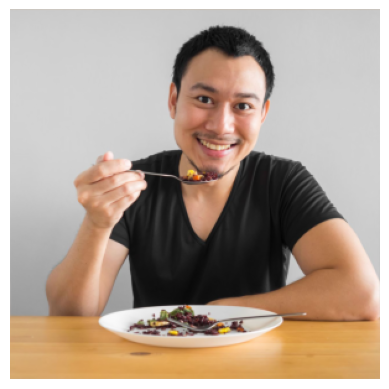

In [83]:
img = obtain_image(url="https://thecenterformindfuleating.org/resources/Pictures/asian%20man%20eating.jpg")
show_img(img)

a man is holding a glass of wine and a glass of wine .
a man is holding a glass of wine and a glass of wine .
a man is holding a glass of wine and a glass of wine .
a man is holding a glass of wine and a glass of wine .
a man holding a glass of wine and a glass of wine .
a man holding a glass of wine and a glass of wine .
a man is holding a glass of wine and a glass of wine .
a man holding a glass of wine and a glass of wine .
a man is holding a glass of wine and a glass of wine .
a man is holding a glass of wine and a glass of wine .


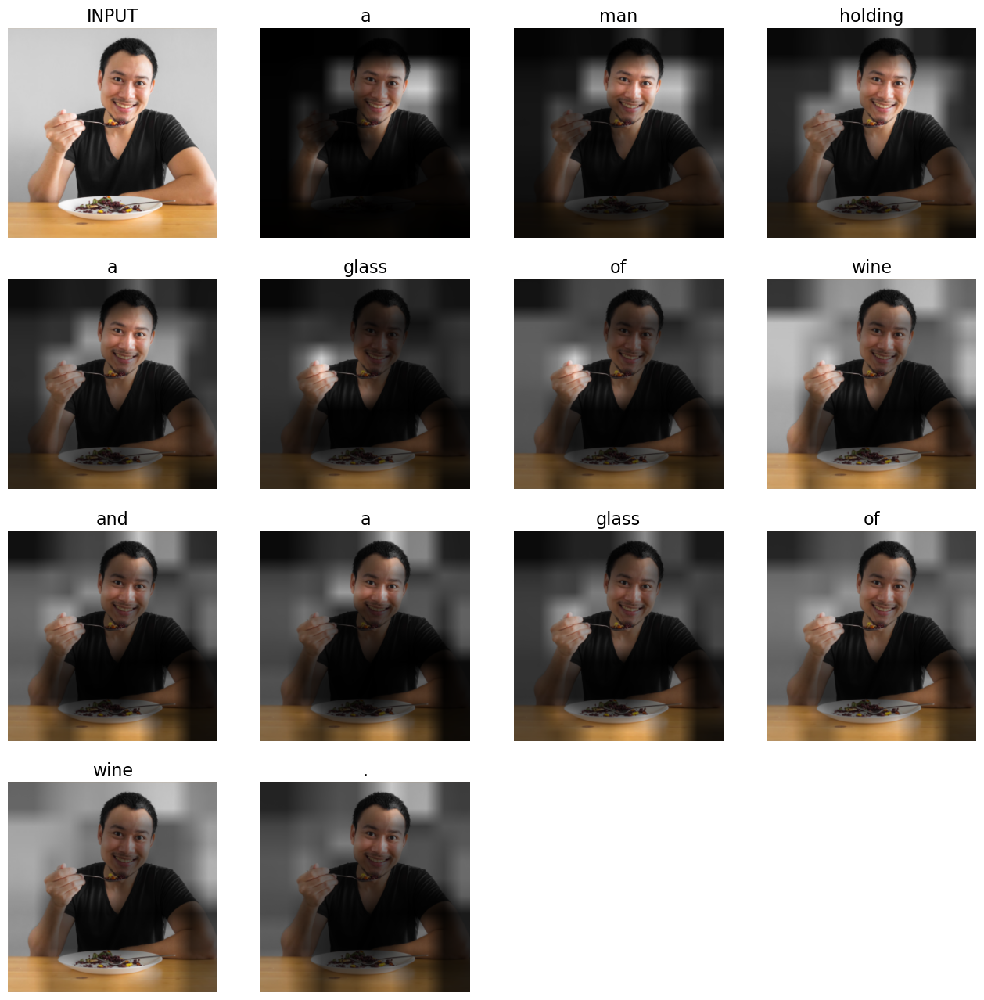

In [86]:
process_image(img)

In [87]:
process_image(obtain_image(url="https://www.dimensioneattiva.it/wp-content/uploads/2016/10/Bike5.jpg"))

UnidentifiedImageError: cannot identify image file '/tmp/tmphlo7ntvk'

a cat is sitting on a chair looking at the camera .
a cat is sitting on a bench next to a pair of shoes .
a cat is sitting on a bench near a car .
a cat is sitting on a bench near a window .
a cat is sitting on a chair near a window .
a cat is sitting on a bench near a person's hand .
a cat is sitting on a chair looking at the camera .
a cat is sitting on a chair looking at the camera .
a cat is sitting on a chair looking at the camera .
a cat is sitting on a bench near a car .


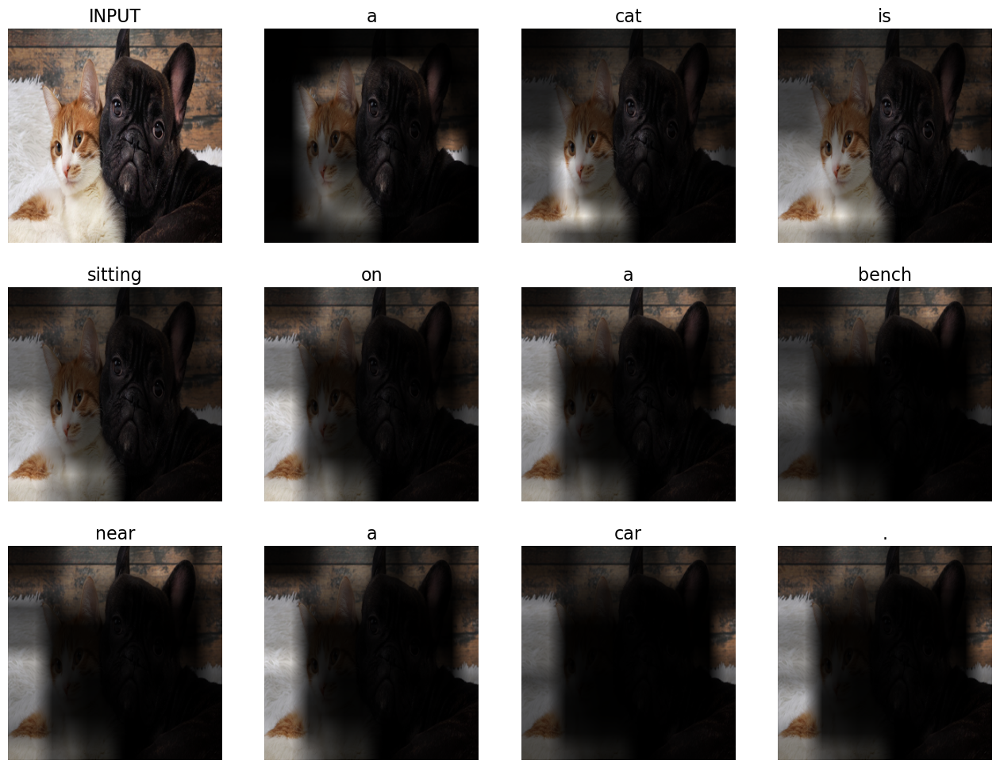

In [88]:
process_image(obtain_image(url="http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg"))

a skateboarder doing tricks on a skateboard at a skate park .
a skateboarder doing tricks on a skateboard at a skate park .
a skateboarder doing tricks on a skateboard at a skate park .
a man doing a skateboard trick in the air .
a man doing a skateboard trick in the air .
a skateboarder doing a trick in the air .
a man doing a skateboard trick in the air .
a man doing a skateboard trick on a skateboard .
a skateboarder doing a trick in a skate park .
a skateboarder doing tricks on a skateboard at a skate park .


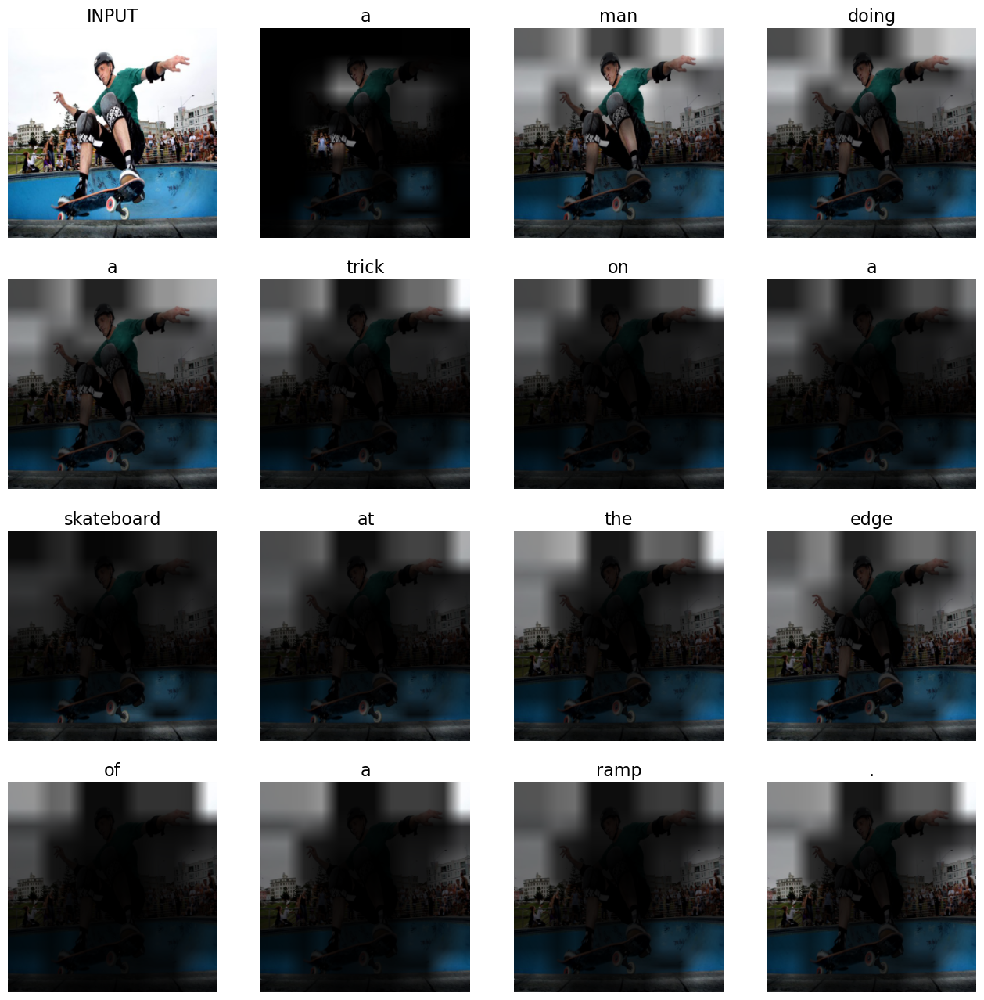

In [47]:
process_image(obtain_image(url="https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg"))

# Demo
### Find at least 10 images to test it on.
* Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
* Make sure it works okay on __simple__ images before going to something more comples
* Photos, not animation/3d/drawings, unless you want to train CNN network on anime
* Mind the aspect ratio

In [ ]:
#apply your network on image sample you found
#
#


a large black bear walking across a lush green field .
a large black bear walking across a lush green field .
a large black bear walking across a large rock .
a brown bear walking through a tree filled forest .
a large black bear walking across a rocky trail .
a brown bear walking through a tree filled forest .
a goose standing on a rock near a rock wall .
a large black bear walking across a tree filled hillside .
a large black bear walking across a rocky trail .
a brown bear walking through a tree filled forest .


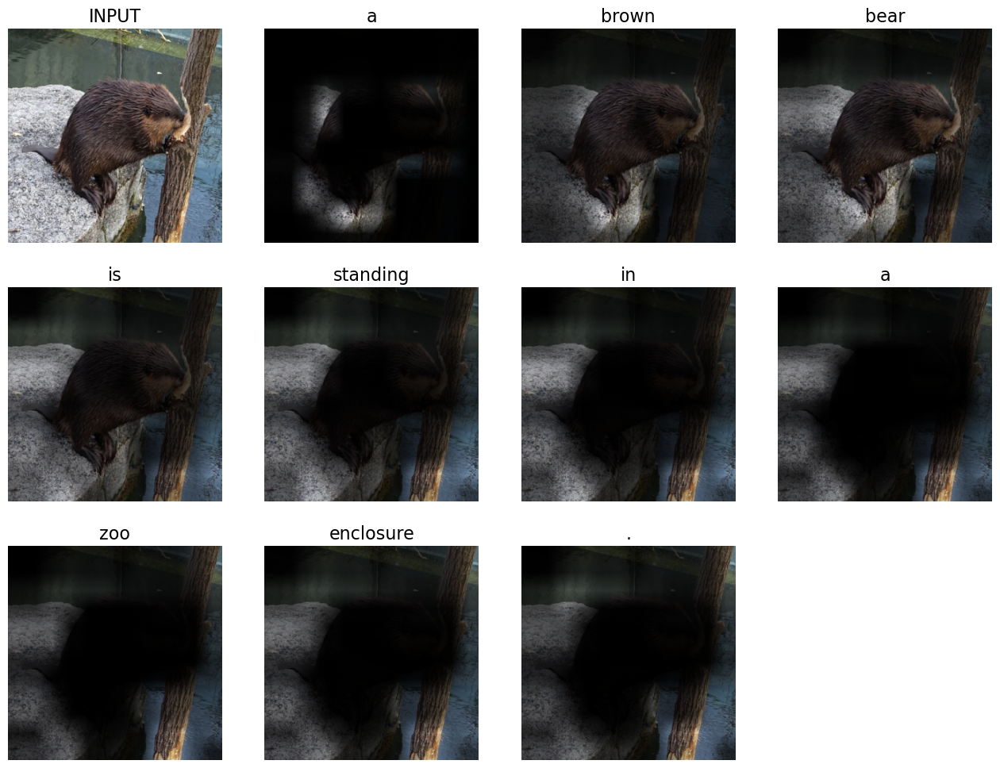

In [48]:
process_image(obtain_image(url="https://pushkinsdelal.ru/wp-content/uploads/2023/01/bobr.jpg"))

a small brown cat is standing in a garden .
a small brown cat is standing in the grass .
a small dog with a yellow frisbee in its mouth .
a small white dog standing in the grass .
a small brown dog is standing in a garden .
a dog with a yellow frisbee in its mouth
a small brown cat is standing in a garden .
a small brown cat is standing in a garden .
a small brown dog is standing in the grass .
a dog with a frisbee in its mouth


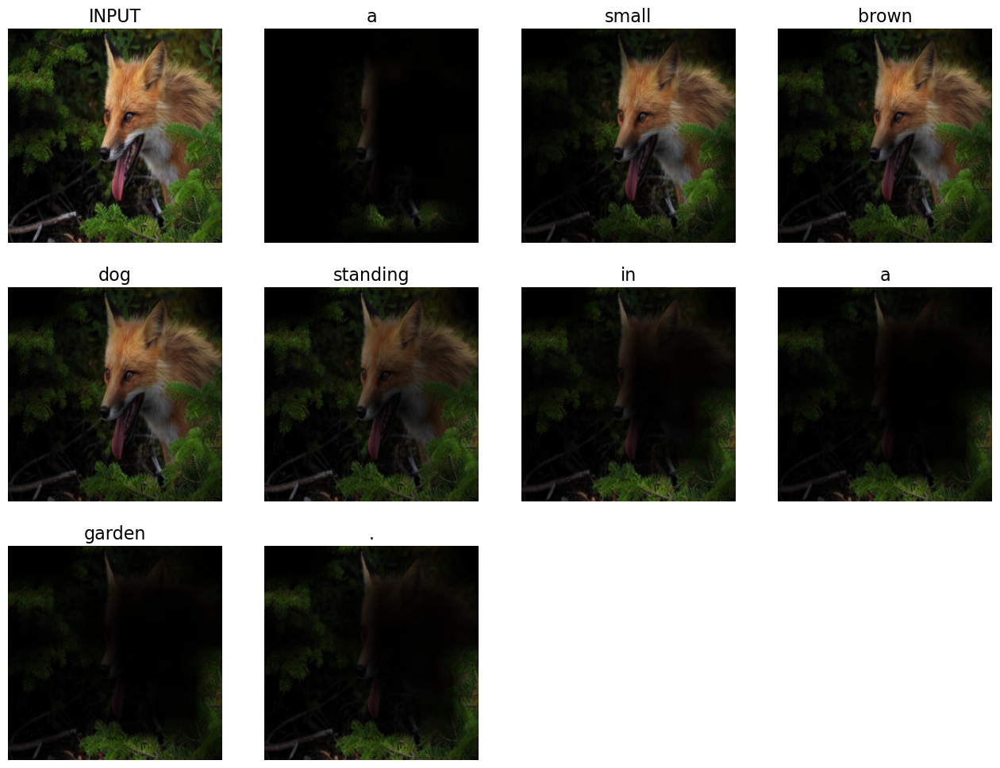

In [49]:
process_image(obtain_image(url="https://haski-mana.ru/wp-content/uploads/0/e/4/0e453b22b9011fc673687053ac3f1dab.jpeg"))


a large passenger airplane flying through a blue sky .
a large passenger airplane flying over a runway .
a large passenger airplane flying through a blue sky .
a large passenger airplane flying over a runway .
a large passenger airplane flying over a runway .
a large passenger airplane flying over a runway .
a large passenger plane flying in the sky .
a large jetliner flying over a runway on a cloudy day .
a large jetliner taking off from an airport runway .
a passenger plane flying over a runway on a cloudy day .


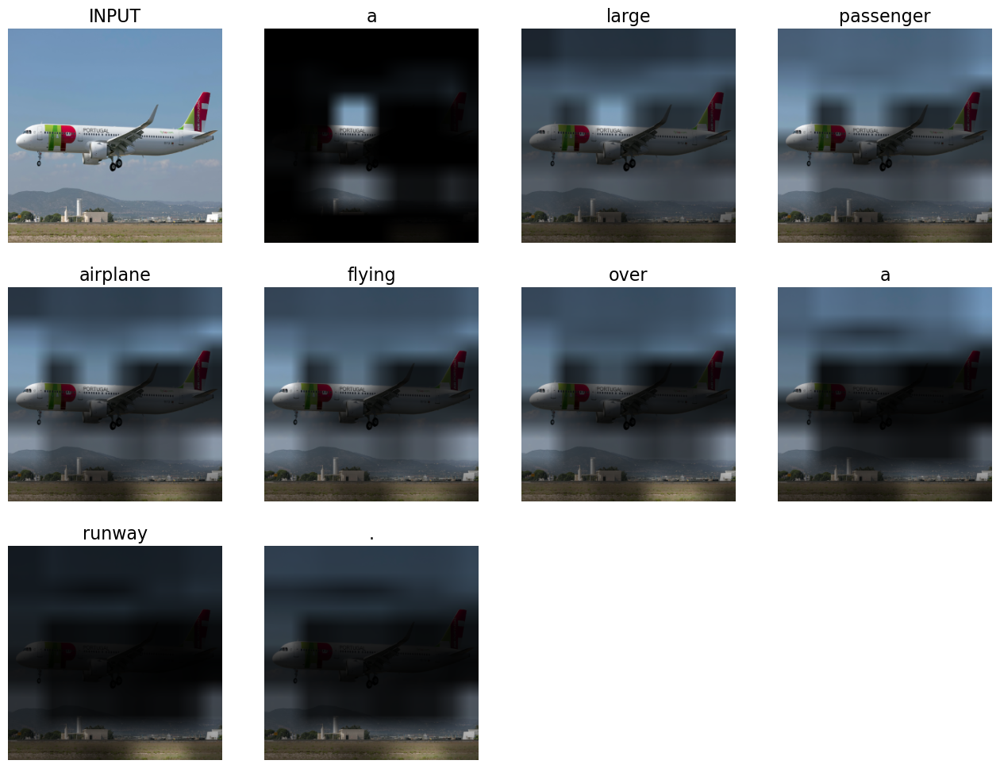

In [50]:
process_image(obtain_image(url="https://upload.wikimedia.org/wikipedia/commons/8/8a/TAP_Air_Portugal_Airbus_A321-251N_at_Faro_Airport.jpg"))

a hamster eats a carrot with a carrot .
a hamster eats a carrot with a carrot in its mouth .
a hamster with a carrot and a carrot
a hamster eats a carrot with a carrot .
a hamster with a carrot and a carrot
a cat that is sitting on a table .
a hamster , a small hamster , a small , and a small yellow apple .
a small hamster with a carrot in its mouth
a hamster with a carrot and a carrot .
a hamster eats a carrot with a carrot in its mouth .


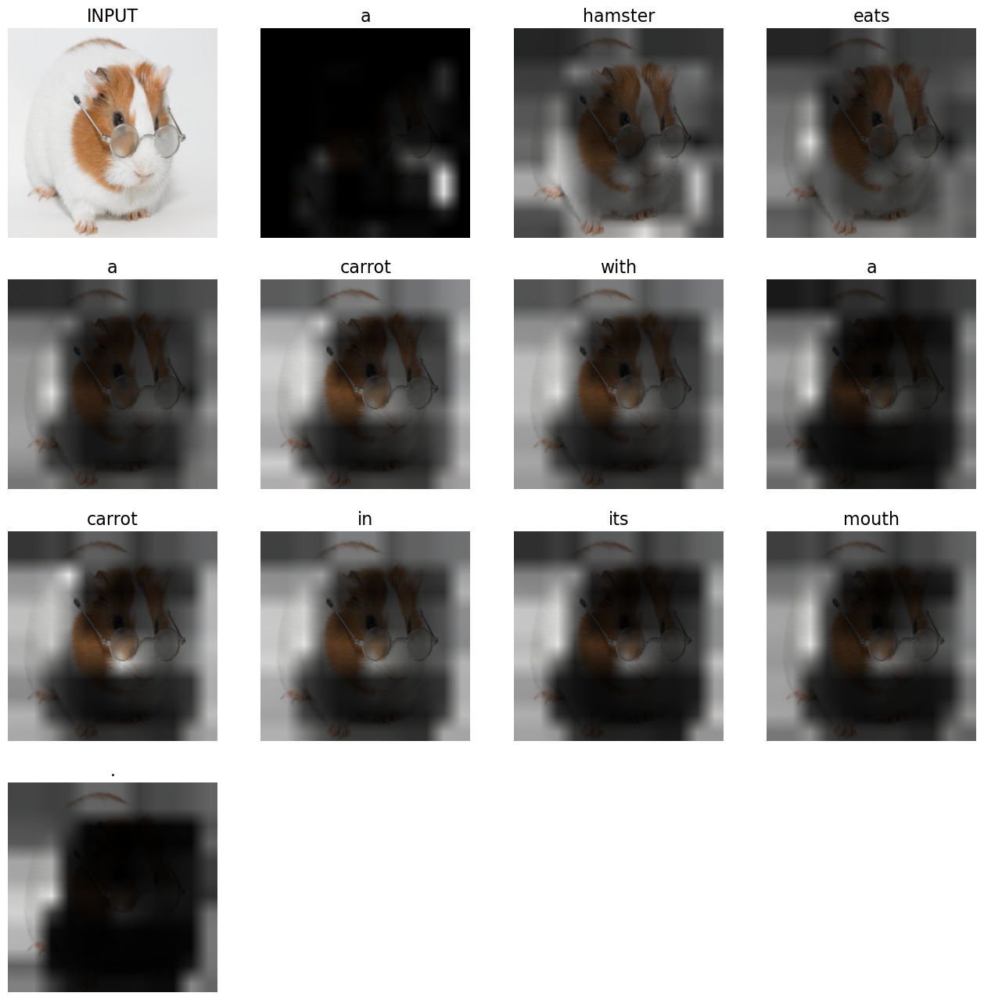

In [51]:
process_image(obtain_image(url="http://kartinkof.club/uploads/posts/2022-04/1649921845_8-kartinkof-club-p-rzhachnie-kartinki-khomyak-v-ochkakh-8.jpg"))

a view of a train with a mountain in the background .
a view of a beach with a mountain in the background .
a view of a large building with a mountain in the background .
a view of a mountain with a mountain in the background .
a large long train is on a steel track .
a view of a mountain with a mountain in the background .
a view of a building with a large bed and a mountain in the background .
a view of a mountain from the top of a mountain .
a view of a mountain with a large mountain in the background .
a large bed with a mountain in the background .


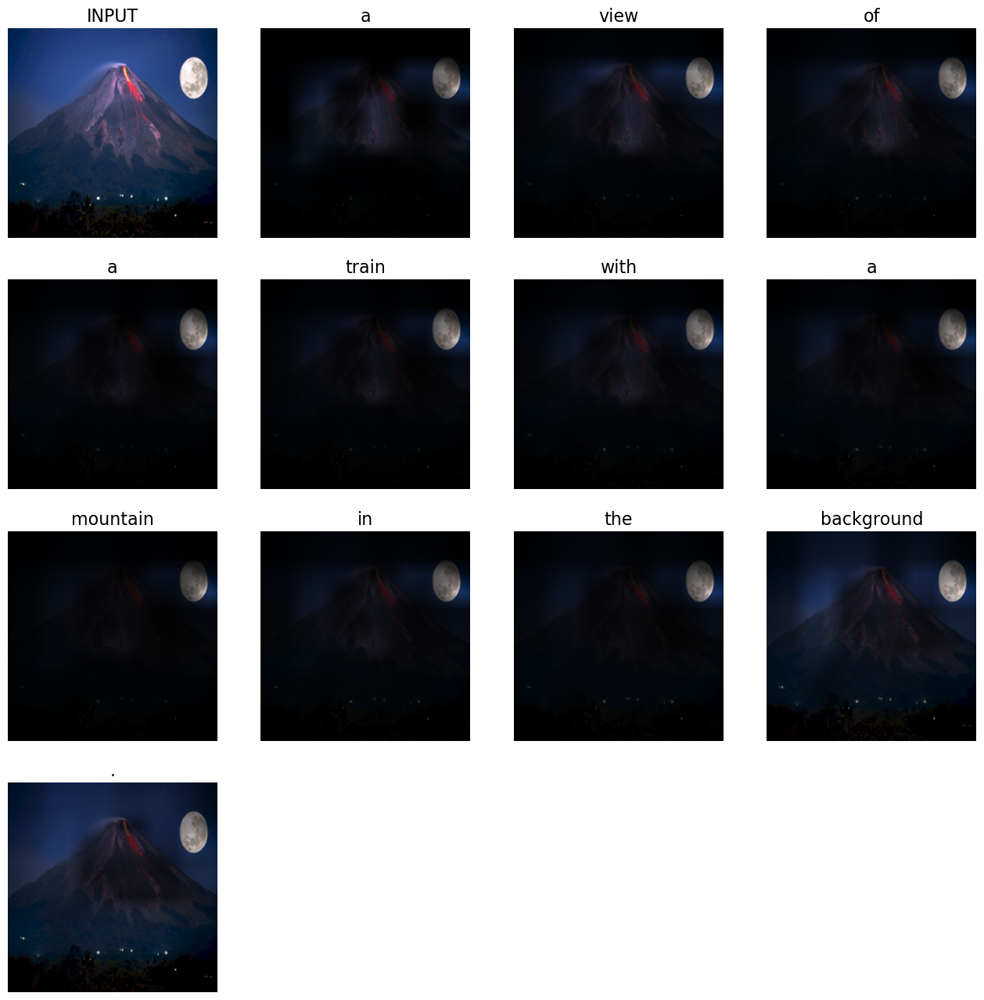

In [52]:
process_image(obtain_image(url="https://cdn.regnum.ru/uploads/pictures/news/2019/01/14/regnum_picture_1547449546144744_normal.jpg"))

a table with a bunch of cupcakes on it
a table with a bunch of cupcakes on it
a large table topped with a bunch of cupcakes .
a table with a bunch of cupcakes on it
a table with a bunch of cupcakes on it
a table with a bunch of cupcakes on it
a table topped with a bunch of cupcakes .
a table topped with a bunch of cupcakes .
a table topped with a bunch of cupcakes
a table with a bunch of cupcakes on it


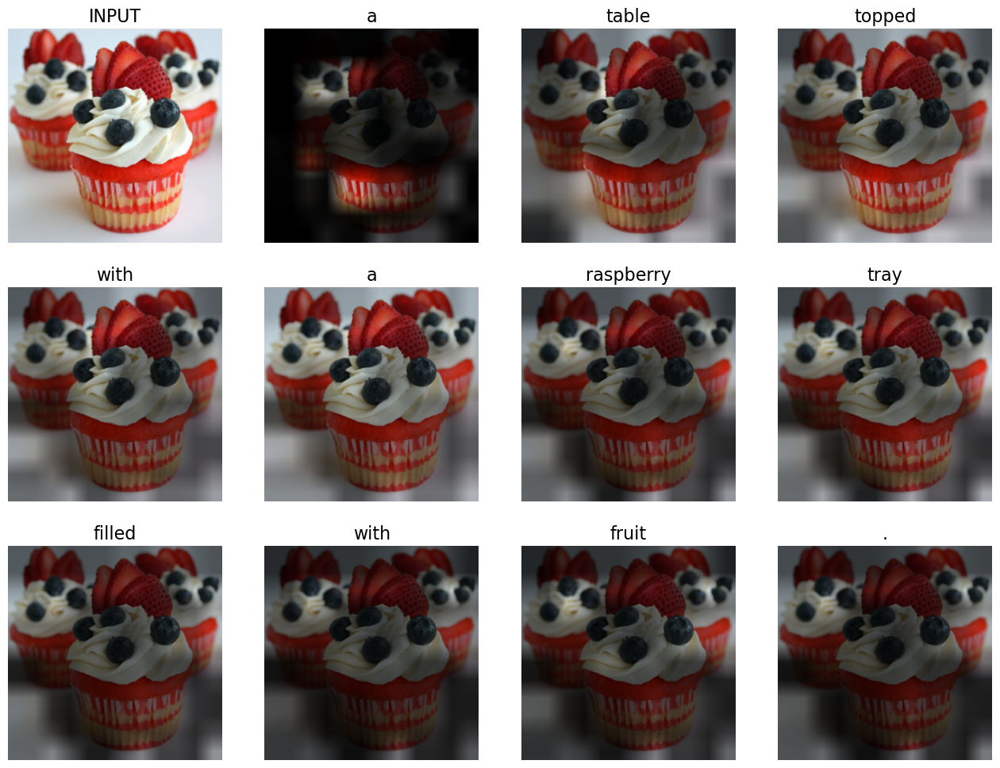

In [53]:
process_image(obtain_image(url='https://mykaleidoscope.ru/uploads/posts/2020-03/1583264889_10-p-kapkeiki-s-klubnikoi-23.jpg'))


a cat that is sitting on a chair
a cat sitting on a couch looking at something .
a cat is looking at something on a string .
a cat that is staring at something
a cat is looking at something on a string .
a cat that is sitting on a bench .
a cat looking at something on a yellow object .
a cat that is staring at something
a cat sitting on top of a couch next to a yellow wall .
a cat sitting on a couch looking at something .


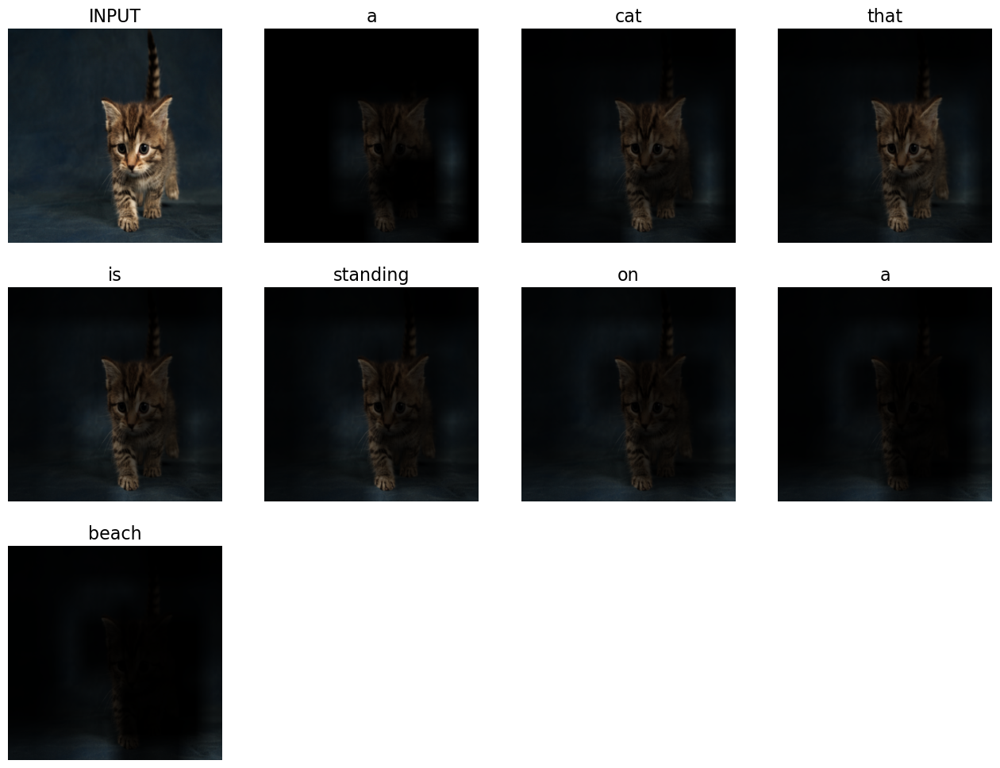

In [54]:
process_image(obtain_image(url='https://w.forfun.com/fetch/29/2994d9b01e5a14f3a6f5a09239761e6f.jpeg'))

a large building with a large clock tower .
a large building with a large building in the background .
a large building with a large building in the background .
a large building with a large building in the background .
a large building with a large building in the background .
a large building with a large building and a large building .
a large building with a large building in the middle .
a large building with a large building in the background .
a large building with a large building in the background .
a large building with a large building in the background .


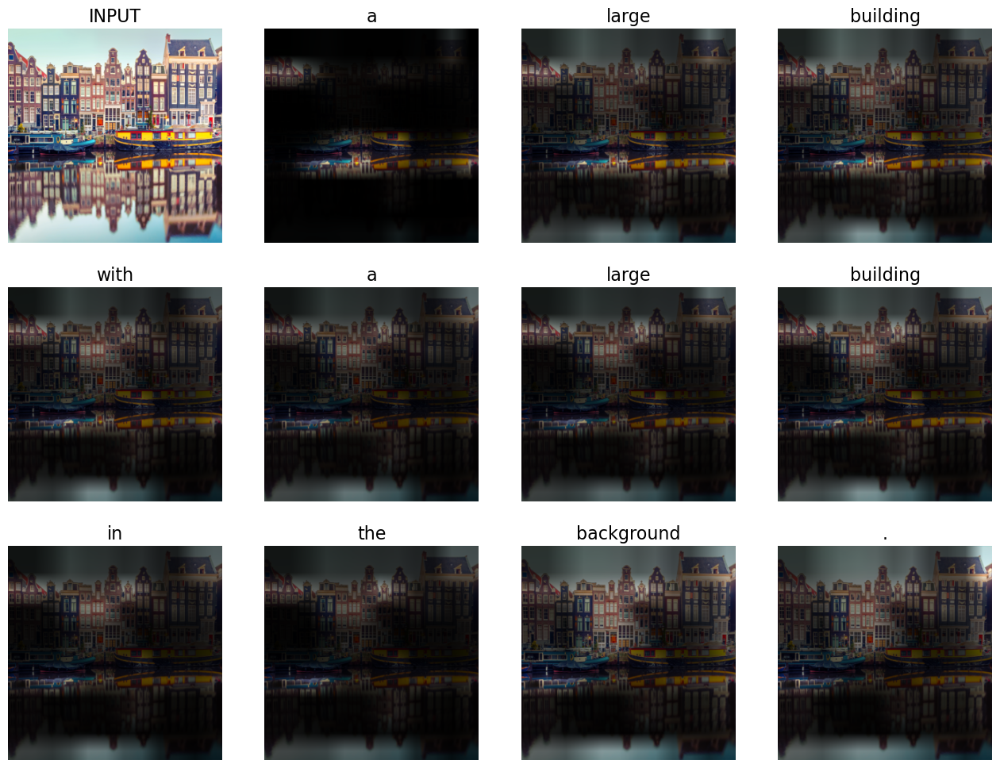

In [55]:
process_image(obtain_image(url='https://plintus.spb.ru/wp-content/uploads/2021/03/fotooboi-kanal-amsterdama.jpg'))

a train on a steel track near a mountain
a train is on a track with a mountain in the background .
a train on a steel track near a mountain .
a train is on a track near a mountain .
a train is on a track near a mountain .
a train is on a steel track near a mountain range .
a train is on the tracks near a mountain .
a train is on the tracks near a mountain .
a train on a steel track near a mountain .
a train is on the tracks near a mountain .


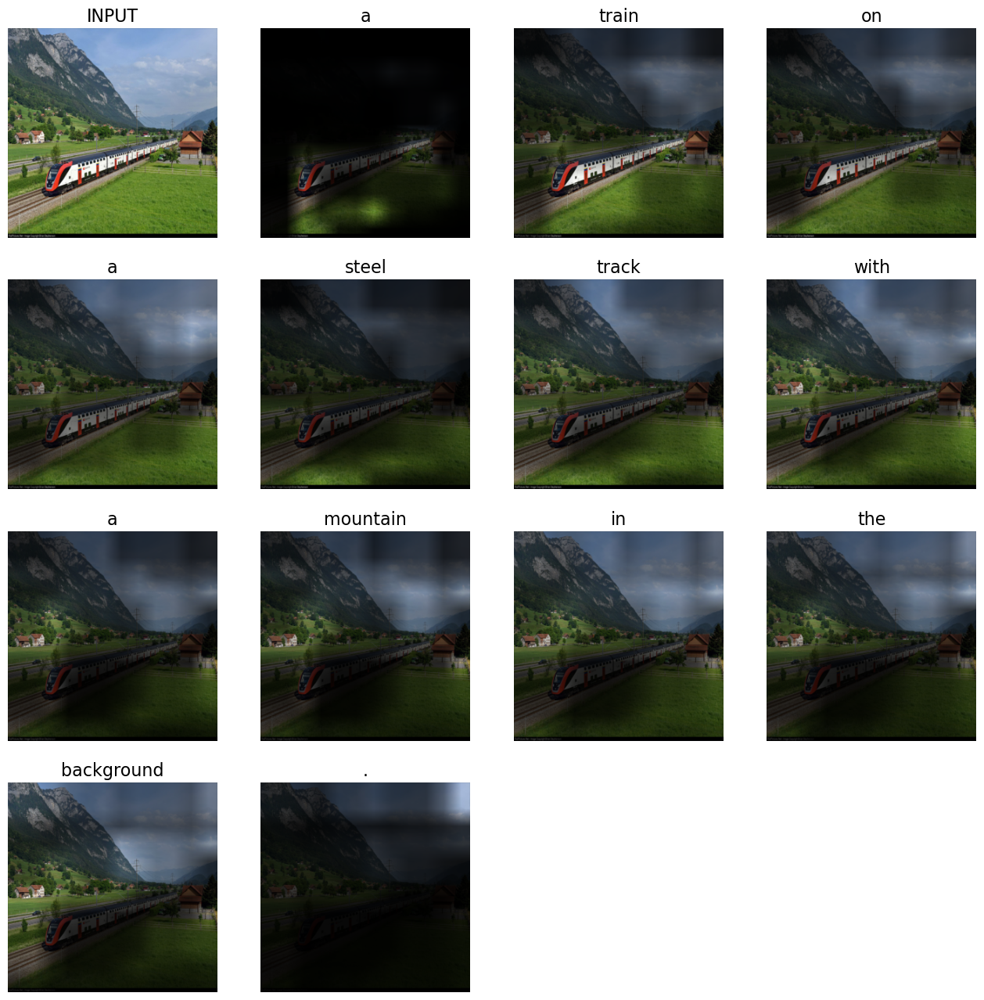

In [56]:
process_image(obtain_image(url='https://i.pinimg.com/originals/0a/38/f8/0a38f88cb3f45cc9b05c8245ad69f880.jpg'))

a bus parked on the side of a road .
a bus parked on a parking lot .
a bus parked on the side of a road .
a bus parked in a parking lot next to a tree .
a bus with a white and black and white bus parked on the side of the road .
a bus parked on the side of a road .
a bus parked on the side of the road .
a bus parked on the side of a road .
a bus parked on the side of the road .
a bus that is on the road .


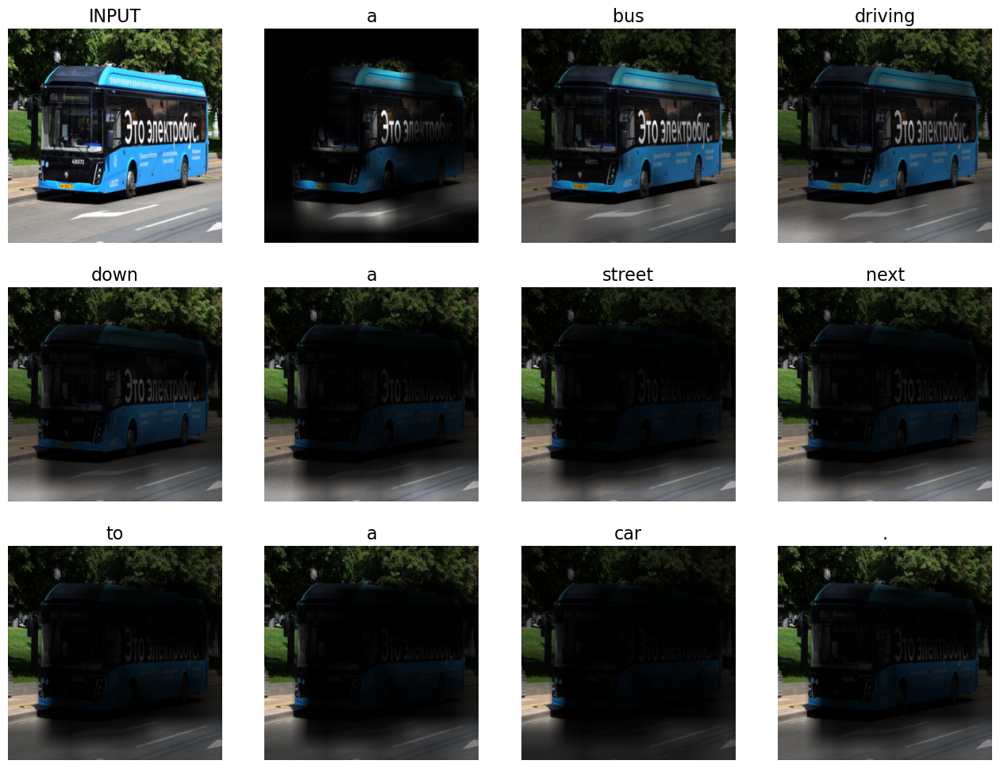

In [57]:
process_image(obtain_image(url='https://www.ugorizont.ru/wp-content/uploads/sites/39/2021/08/5eea293382682c271a7f6bbb-scaled.jpg'))

a man riding a horse on a beach .
a man riding a horse on top of a metal pole .
a person wearing a hat and a tie
a tall tower with a clock on top of it .
a man riding a horse on top of a metal pole .
a man wearing a hat and a tie on a building .
a man riding a horse on top of a metal pole .
a man riding a horse on a stone walkway .
a man riding a horse on top of a metal pole .
a man riding a horse on a cloudy day .


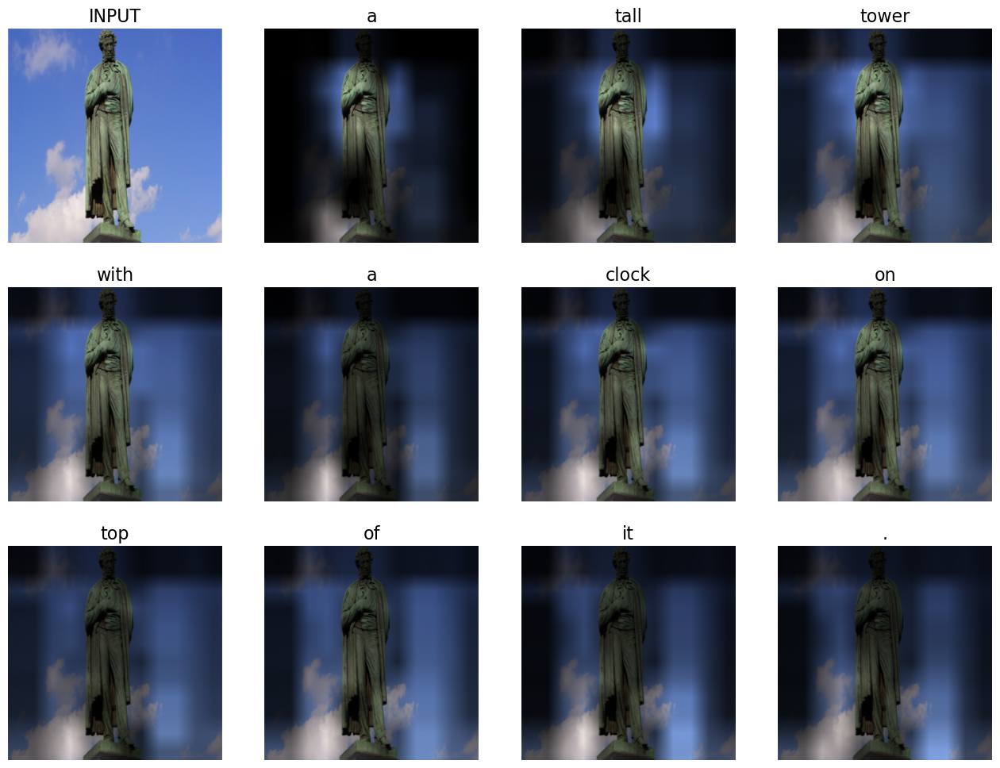

In [58]:
process_image(obtain_image(url='https://regnum.ru/uploads/pictures/news/2017/03/28/regnum_picture_1490685172215644_normal.jpg'))

### Conclusion
Here is a place for your conclusions, observations, hypotheses, and any other feedback.

Добавление слоев в self.cnn_to_attn_key позволяет нейросети разбирать картинки с большим кол-вом деталей. Без в картинке с большим кол-вом кексов получалось совершенно неинформативное описание.

Добавление слоев в self.logits_mlp улучшает сопаставление предметов. Наприимер, первая картинка теперь выдает точное описание, хотя до этого она добавляла в описанеи предметы, которых просто не было.

ReLU себя показала хуже, чем более гладкие функции активации, т.к. выдавла более острые границы и соответсвенно теряла в детализации. SiLU соответсвенно показала себя лучше, т.к. она явлется гладкой и не имеет нулевых градиентов.

В целом небольшое усложнение слоев с увеличением размера batch_size позволяет лучше составлять описание для картинок с большим количеством деталей и лучше улавливается контекст.
Но все еще неправильно распознаются похожие животные (лиса выдается за собаку, а бобра за медведя) и иногда появляются предметы которых нет (в картинке с автобусом появлется машина)

### Now what?

Your model produces some captions but you still strive to improve it? You're damn right to do so. Here are some ideas that go beyond simply "stacking more layers". The options are listed easiest to hardest.

##### Attention
You can build better and more interpretable captioning model with attention over the generated part of the sentense.

##### Subword level captioning
In the base version, we replace all rare words with UNKs which throws away a lot of information and reduces quality. A better way to deal with vocabulary size problem would be to use Byte-Pair Encoding

* BPE implementation you can use: [github_repo](https://github.com/rsennrich/subword-nmt).
* Theory: https://arxiv.org/abs/1508.07909
* It was originally built for machine translation, but it should work with captioning just as well.

#### Reinforcement learning
* After your model has been pre-trained in a teacher forced way, you can tune for captioning-speific models like CIDEr.
* Tutorial on RL for sequence models: [practical_rl week8](https://github.com/yandexdataschool/Practical_RL/tree/master/week8_scst)
* Theory: https://arxiv.org/abs/1612.00563